# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


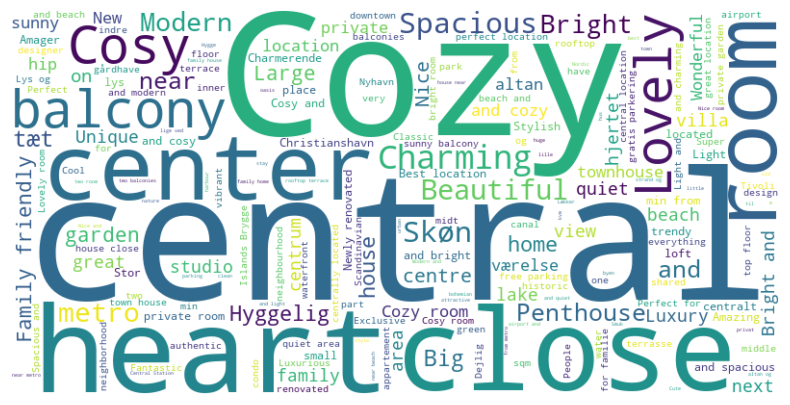

In [703]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
#data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)
data_filtered['price'] = data_filtered['price'].replace(r'[\$,]', '', regex=True).astype(float)

# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

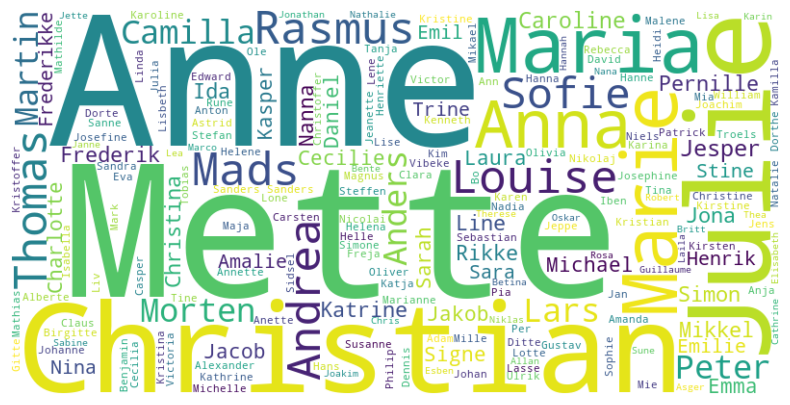

In [724]:
import re

names_stop_words = ['Forenom', 'Denmark', 'ApartmentinCopenhagen']

def is_person_name(name):
    return bool(re.match(r'^[a-zA-Z\'-]+$', name))

# Convert the 'host_name' column to a single string
data_filtered['host_name_cleaned'] = data_filtered['host_name'].apply(lambda x: x if is_person_name(x) else '')
text = ' '.join(data_filtered['host_name_cleaned'].astype(str))

# Create and generate a word cloud image - with default list of stopwords
wordcloud = WordCloud(stopwords=names_stop_words,background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Comparison to Danmarks Statistik
- Woman's names seem to match, although the order is not necessarily one-to-one
(2024)
    - 1 	Anne 	43.741
    - 2 	Mette 	38.133
    - 3 	Kirsten 	36.401
    - 4 	Hanne 	35.725
    - 5 	Anna 	33.537
- Men's names seem to be off, as their relative size does not seem to reflect the statistics
(2024)
    - 1 	Peter 	46.552
    - 2 	Michael 	44.338
    - 3 	Lars 	43.290
    - 4 	Jens 	42.123
    - 5 	Thomas 	41.914

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [705]:
# Using folium library to plot the apartments - here's the import
from folium.plugins import MarkerCluster
import folium

In [706]:
# Create map centered on first entry's position with zoom out to cover entire Copenhagen area
map = folium.Map(location=[data_filtered['latitude'][0],data_filtered['longitude'][0]], zoom_start=12)

marker_cluster = MarkerCluster().add_to(map)

# Iterate over entries and create marker for each one
for index, entry in data_filtered.iterrows():
    folium.Marker(
        location=[entry['latitude'], entry['longitude']],
        popup=entry['name']
    ).add_to(marker_cluster)

display(map)

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

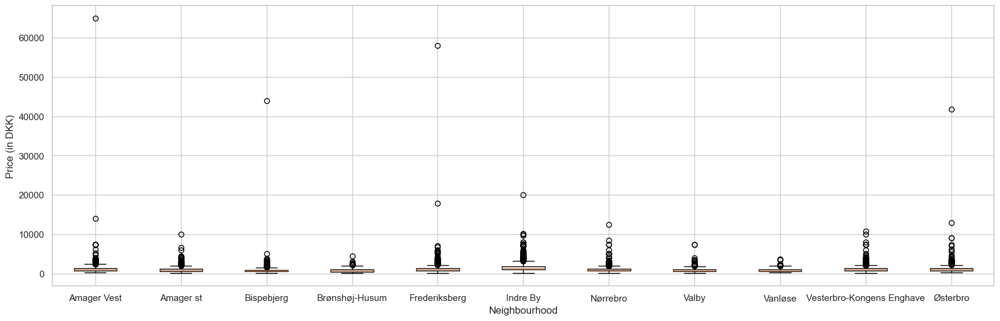

In [707]:
# Neighbourhood - price plot - which district is the most expensive?
nbh_price = data_filtered.groupby('neighbourhood_cleansed')['price'].apply(list)
plt.figure(figsize=(20,6))
plt.boxplot(nbh_price, tick_labels=nbh_price.index)

plt.xlabel('Neighbourhood')
plt.ylabel('Price (in DKK)')
plt.show()

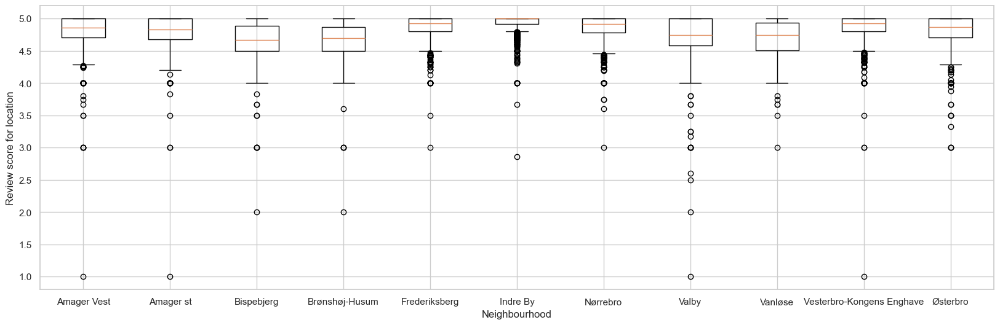

In [708]:
# Neighbourhood - location score plot - what is the 'best' district?
nbh_rsl = data_filtered.groupby('neighbourhood_cleansed')['review_scores_location'].apply(list)
plt.figure(figsize=(20,6))
plt.boxplot(nbh_rsl, tick_labels=nbh_rsl.index)

plt.xlabel('Neighbourhood')
plt.ylabel('Review score for location')
plt.show()

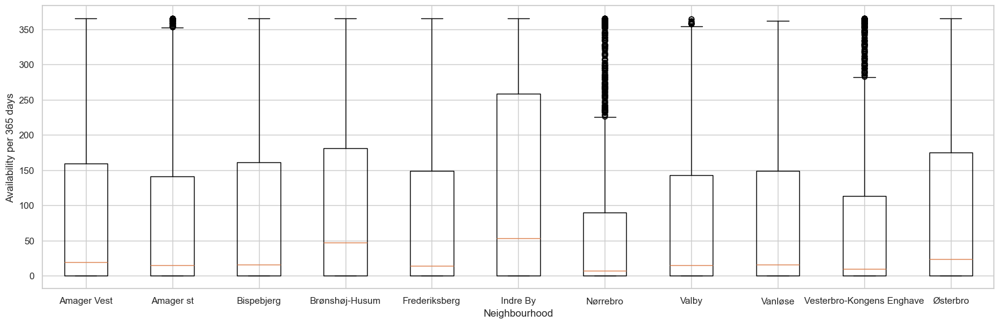

In [709]:
# Neighbourhood - availability plot - how busy the property is per 365 days?
nbh_a365 = data_filtered.groupby('neighbourhood_cleansed')['availability_365'].apply(list)
plt.figure(figsize=(20,6))
plt.boxplot(nbh_a365, tick_labels=nbh_a365.index)

plt.xlabel('Neighbourhood')
plt.ylabel('Availability per 365 days')
plt.show()

### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

In [710]:
# We could potentially calculate it ourselves but there is a function for that
def descriptive_analysis(series):
    return {
        'Mean': series.mean(),
        'Mode': series.mode()[0] if not series.mode().empty else None,
        'Median': series.median(),
        'Std Dev': series.std(),
        'Variance': series.var(),
        'Min': series.min(),
        'Max': series.max(),
        '25th Percentile (Q1)': series.quantile(0.25),
        '50th Percentile (Median/Q2)': series.median(),
        '75th Percentile (Q3)': series.quantile(0.75),
    }

data = data_filtered.groupby(['neighbourhood_cleansed','room_type'])

price_statistics = data['price'].apply(descriptive_analysis).unstack()
reviews_statistics = data['reviews_per_month'].apply(descriptive_analysis).unstack()

display(price_statistics)
display(reviews_statistics)

Mean    Mode  Median  \
neighbourhood_cleansed    room_type                                      
Amager Vest               Entire home/apt  1234.226623  1000.0  1050.0   
                          Private room     1032.966216   500.0   500.0   
                          Shared room      1051.500000   972.0  1051.5   
Amager st                 Entire home/apt  1093.584071  1000.0   900.0   
                          Hotel room       1296.000000  1149.0  1201.0   
                          Private room      549.325581   450.0   471.0   
                          Shared room      2575.000000  2575.0  2575.0   
Bispebjerg                Entire home/apt   992.592520   700.0   800.0   
                          Private room      488.978947   300.0   400.0   
                          Shared room       198.000000   198.0   198.0   
Brønshøj-Husum            Entire home/apt  1014.995370  1400.0   900.0   
                          Private room      445.552239   500.0   400.0   
                          Shared room       211.500000   200.0   211.5   
Frederiksberg             Entire home/apt  1292.472222  1000.0  1037.0   
                          Private room      621.706767   500.0   500.0   
Indre By                  Entire home/apt  1642.387192  1200.0  1400.0   
                          Hotel room       1077.200000  1306.0  1306.0   
                          Private room      698.984375   450.0   582.0   
                          Shared room       292.000000   223.0   280.0   
Nørrebro                  Entire home/apt  1047.742192  1000.0   950.0   
                          Private room      650.121212   500.0   500.0   
                          Shared room       324.666667   400.0   400.0   
Valby                     Entire home/apt  1017.968889   700.0   899.0   
                          Private room      498.157303   500.0   438.0   
Vanløse                   Entire home/apt   954.425197   700.0   826.5   
                          Private room      413.409091   300.0   337.5   
Vesterbro-Kongens Enghave Entire home/apt  1181.435119  1000.0  1000.0   
                          Private room      574.366516   500.0   500.0   
                          Shared room       330.500000   250.0   330.5   
Østerbro                  Entire home/apt  1248.551107  1000.0  1000.0   
                          Private room      605.461538   400.0   500.0   
                          Shared room       469.000000   469.0   469.0   

                                               Std Dev      Variance     Min  \
neighbourhood_cleansed    room_type                                            
Amager Vest               Entire home/apt   832.696891  6.933841e+05   250.0   
                          Private room     5299.018095  2.807959e+07   200.0   
                          Shared room       112.429978  1.264050e+04   972.0   
Amager st                 Entire home/apt   721.982284  5.212584e+05   240.0   
                          Hotel room        211.184753  4.459900e+04  1149.0   
                          Private room      293.995992  8.643364e+04   135.0   
                          Shared room              NaN           NaN  2575.0   
Bispebjerg                Entire home/apt  1981.580545  3.926661e+06   235.0   
                          Private room      353.674089  1.250854e+05   143.0   
                          Shared room              NaN           NaN   198.0   
Brønshøj-Husum            Entire home/apt   555.669548  3.087686e+05   250.0   
                          Private room      201.631624  4.065531e+04   145.0   
                          Shared room        16.263456  2.645000e+02   200.0   
Frederiksberg             Entire home/apt  1958.802772  3.836908e+06   300.0   
                          Private room      567.611220  3.221825e+05   185.0   
Indre By                  Entire home/apt  1072.616232  1.150506e+06   350.0   
                          Hotel room        654.255098  4.280497e+05   204.0   
             

Mean   Mode  Median   Std Dev  \
neighbourhood_cleansed    room_type                                             
Amager Vest               Entire home/apt   0.800539   0.07   0.450  1.017004   
                          Private room      1.439459   0.06   0.800  1.664748   
                          Shared room       0.010000   0.01   0.010  0.000000   
Amager st                 Entire home/apt   0.893489   0.14   0.520  1.090924   
                          Hotel room        0.346667   0.28   0.370  0.058595   
                          Private room      1.783023   0.03   1.150  1.948648   
                          Shared room       0.040000   0.04   0.040       NaN   
Bispebjerg                Entire home/apt   0.800276   0.12   0.480  1.032995   
                          Private room      1.323263   0.06   0.770  1.630881   
                          Shared room      15.740000  15.74  15.740       NaN   
Brønshøj-Husum            Entire home/apt   0.679120   0.15   0.360  0.945167   
                          Private room      1.268358   1.24   0.750  1.393068   
                          Shared room       0.925000   0.57   0.925  0.502046   
Frederiksberg             Entire home/apt   0.745967   0.23   0.435  0.816371   
                          Private room      0.923684   0.08   0.540  1.221679   
Indre By                  Entire home/apt   1.118801   1.00   0.650  1.299079   
                          Hotel room        1.988000   0.03   1.100  2.167189   
                          Private room      1.552500   0.30   0.945  1.619804   
                          Shared room       2.487500   0.76   2.770  1.269051   
Nørrebro                  Entire home/apt   0.811106   1.00   0.510  0.893358   
                          Private room      1.037455   0.08   0.660  1.051469   
                          Shared room       1.060000   0.13   0.600  1.226499   
Valby                     Entire home/apt   0.788378   0.08   0.455  0.954696   
                          Private room      1.279101   0.06   0.710  1.591516   
Vanløse                   Entire home/apt   0.778425   0.08   0.355  0.989824   
                          Private room      1.571818   0.78   1.260  1.296131   
Vesterbro-Kongens Enghave Entire home/apt   0.847322   1.00   0.540  0.923577   
                          Private room      1.442081   0.08   0.860  2.069227   
                          Shared room       4.765000   0.05   4.765  6.668017   
Østerbro                  Entire home/apt   0.742700   0.08   0.460  0.859251   
                          Private room      0.968923   1.00   0.670  0.976140   
                          Shared room       1.200000   1.20   1.200       NaN   

                                            Variance    Min    Max  \
neighbourhood_cleansed    room_type                                  
Amager Vest               Entire home/apt   1.034298   0.02   9.41   
                          Private room      2.771387   0.01   9.65   
                          Shared room       0.000000   0.01   0.01   
Amager st                 Entire home/apt   1.190115   0.01  10.68   
                          Hotel room        0.003433   0.28   0.39   
                          Private room      3.797229   0.01   9.08   
                          Shared room            NaN   0.04   0.04   
Bispebjerg                Entire home/apt   1.067078   0.01  11.34   
                          Private room      2.659773   0.03   7.50   
                          Shared room            NaN  15.74  15.74   
Brønshøj-Husum            Entire home/apt   0.893340   0.01   7.18   
                          Private room      1.940638   0.03   5.93   
                          Shared room       0.252050   0.57   1.28   
Frederiksberg             Entire home/apt   0.666461   0.01   5.23   
                          Private room      1.492501   0.01   7.04   
Indre By                  Entire home/apt   1.687607   0.01  19.23   
                          Hotel r

### 5. Based on self-chosen features, develop three different regression models that can predict the price of a rental property. Remember to divide your data into training data and test data. Comment on your findings.

## Selected features and their relation
- neighbourhood_cleansed - indirectly points at the location of the property, could be an indicator for a price
- room_type - similarily to previous feature, size of a rented space could be factor for a price
- availability_365 - low availability could be an indicator for popularity, which could drive the price up
- number_of_reviews - more reviews often correlate with higher prices
- review_scores_rating - similarily to previous feature, high rating can cause the price to be higher
- reviews_per_month - frequent reviews are also an indicator for popularity, which can be reflected in price

In [711]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

features = data_filtered[['neighbourhood_cleansed', 'room_type', 'availability_365', 'number_of_reviews', 'review_scores_rating', 'reviews_per_month']]
labels = data_filtered['price']

# Train-test split
X_train, X_test, Y_train, Y_test = train_test_split(features, labels, test_size=0.5, shuffle=True)

# Unique values for replacement
room_types = data_filtered['room_type'].unique()

# Replacement dictionaries
replacement_nb_dict = {value: i for i, value in enumerate(neighbourhoods)}
replacement_rt_dict = {value: i for i, value in enumerate(room_types)}

# Replace categorical features with numerical values
X_train['neighbourhood_cleansed'] = X_train['neighbourhood_cleansed'].replace(replacement_nb_dict)
X_train['room_type'] = X_train['room_type'].replace(replacement_rt_dict)

X_test['neighbourhood_cleansed'] = X_test['neighbourhood_cleansed'].replace(replacement_nb_dict)
X_test['room_type'] = X_test['room_type'].replace(replacement_rt_dict)

# Display the training data
display(X_train)

,neighbourhood_cleansed,room_type,availability_365,number_of_reviews,review_scores_rating,reviews_per_month
3836,1,0,0,9,5.00,0.16
1948,0,0,0,18,4.89,0.24
12132,0,1,354,8,4.88,3.81
7466,5,0,0,5,4.40,0.19
2995,0,0,88,12,4.92,0.18
...,...,...,...,...,...,...
12073,5,0,32,6,5.00,2.47
8577,3,0,365,7,4.71,0.54
1983,0,0,0,22,4.76,0.28
1153,0,0,12,65,4.83,0.69


## Model construction and test

Cells below contain code for
1. Importing the necessary libraries
2. Fitting the models with train features and labels
3. Getting the predictions for the test set
4. Evaluation of the model's prediction accuracy

Assessment is based on two categories of factors:
1. Using `score` function to determine the accuracy of the model
2. Calculating 
    Mean Squared Error (how much on average the model is 'off' with it's predictions) 
    and 
    Coefficient of Determination (how are the model's predicitions in comparison to mean)
   to get a better understanding for the score.

In [712]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

regr = linear_model.LinearRegression()

# Fit the model
regr.fit(X_train, Y_train)

# Make predictions using the testing set
Y_pred = regr.predict(X_test)

# Calculating MSE and R^2
mse_lin = mean_squared_error(Y_test, Y_pred)
r2_lin = r2_score(Y_test, Y_pred)

print("Mean squared error: %.2f" % mse_lin)
print("Coefficient of determination: %.2f" % r2_lin)

Mean squared error: 807148.49
Coefficient of determination: 0.09


In [713]:
print("Accuracy score: {}".format(regr.score(X_test, Y_test)))

Accuracy score: 0.08518481005816902


In [714]:
from sklearn.linear_model import Ridge

# Initialize the Ridge regression model with an alpha value
ridge_model = Ridge(alpha=0.1)

# Fit the model
ridge_model.fit(X_train, Y_train)

# Make predictions
Y_pred_ridge = ridge_model.predict(X_test)

# Calculating MSE and R^2
mse_ridge = mean_squared_error(Y_test, Y_pred_ridge)
r2_ridge = r2_score(Y_test, Y_pred_ridge)

print("Ridge Regression Mean squared error: %.2f" % mse_ridge)
print("Ridge Regression Coefficient of determination: %.2f" % r2_ridge)


Ridge Regression Mean squared error: 807149.43
Ridge Regression Coefficient of determination: 0.09


In [715]:
print("Accuracy score: {}".format(ridge_model.score(X_test, Y_test)))

Accuracy score: 0.0851837386773805


In [716]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split, GridSearchCV

# Initialize the Lasso regression model with an alpha value
lasso_model = Lasso(alpha=0.1)

# Fit the model
lasso_model.fit(X_train, Y_train)

# Make predictions
Y_pred_lasso = lasso_model.predict(X_test)

# Calculating MSE and R^2
mse_lasso = mean_squared_error(Y_test, Y_pred_lasso)
r2_lasso = r2_score(Y_test, Y_pred_lasso)

print("Lasso Regression Mean squared error (log scale): %.2f" % mse_lasso)
print("Lasso Regression Coefficient of determination (log scale): %.2f" % r2_lasso)

Lasso Regression Mean squared error (log scale): 807161.76
Lasso Regression Coefficient of determination (log scale): 0.09


In [717]:
print("Accuracy score: {}".format(ridge_model.score(X_test, Y_test)))

Accuracy score: 0.0851837386773805


## Results

All of the models performed poorly, with the accuracy around 2.5% to 5%.

Attached below is a graph visualizing the difference in predictions of the Lasso model.
From it, the following can be determined:
- There are several points with high residuals, which can mean that there are outliers in the data
    - These points may be the reason for high MSE for all models
- As the price increases, the model struggles to make an accurate prediction
    - There is also a tendence, where there are more points that are below the zero line, indicating that the Lasso model is underprediciting at higher prices
- There are a few predictions, where the guest is paid to stay, meaning there is a possibility that the model is overpredicting

The models created work reasonably well for listings with lower price, but tend to struggle as it reaches the value of over a 1000.
This could indicate, that the linear models (or our data preparation and feature selection) is not fully capturing the complexity, that is present in this relation.
Potential solutions to that problem could include:
- Using non-linear models
- Transformation of the price
- Feature engineering - to show the corelation between features (for example, room_type and neighbourhood_cleansed: to capture the significant increase in price for bigger lots in the city centre.)

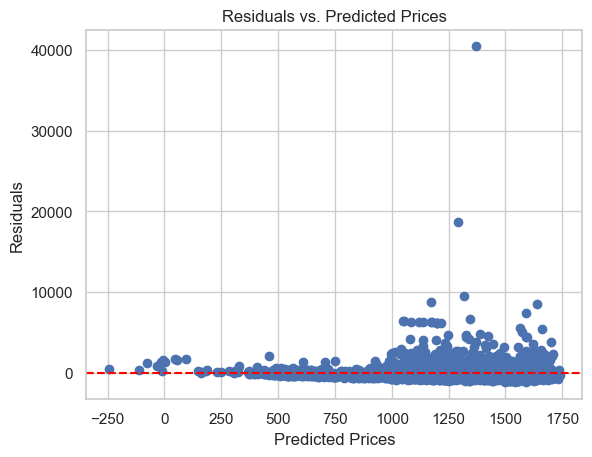

In [718]:
plt.scatter(Y_pred_lasso, Y_test - Y_pred_lasso)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Prices')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Prices')
plt.show()